# Importing Packages

In [21]:
import pandas as pd
import numpy as np
import cv2
from skimage import io
from glob import glob
import os
import pydicom
import matplotlib.pyplot as plt
import albumentations as A
from PIL import Image
from skimage.color import label2rgb
import random

In [2]:
df = pd.read_csv("../data/train_df.csv", index_col=0)

In [3]:
df.head()

,file,patient_id,lesion_id,gender,age,site,diagnosis,ben_mal,target,gen_enc,site_enc,diag_enc
0,ISIC_2637011,IP_7279968,IL_7972535,male,45.0,head/neck,unknown,benign,0,1,0,8
1,ISIC_0015719,IP_3075186,IL_4649854,female,45.0,upper extremity,unknown,benign,0,0,6,8
2,ISIC_0052212,IP_2842074,IL_9087444,female,50.0,lower extremity,nevus,benign,0,0,1,5
3,ISIC_0068279,IP_6890425,IL_4255399,female,45.0,head/neck,unknown,benign,0,0,0,8
4,ISIC_0074268,IP_8723313,IL_6898037,female,55.0,upper extremity,unknown,benign,0,0,6,8


# Assigning Paths

In [9]:
# === DICOM ===
# Create the paths
path_tr_dcm = '../split/train_dcm/' + df['file'] + '.dcm'
path_tr_jpg = '../split/train/mel/2020/' + df['file'] + '.jpg'

# Append to the original dataframes
df['path_dcm'] = path_tr_dcm
df['path_jpg'] = path_tr_jpg

In [17]:
df['dcm'] = df.file.apply(lambda x: str(x) + '.dcm')
df['jpg'] = df.file.apply(lambda x: str(x) + '.jpg')

In [10]:
df.head()

,file,patient_id,lesion_id,gender,age,site,diagnosis,ben_mal,target,gen_enc,site_enc,diag_enc,path_dcm,path_jpg
0,ISIC_2637011,IP_7279968,IL_7972535,male,45.0,head/neck,unknown,benign,0,1,0,8,../split/train_dcm/ISIC_2637011.dcm,../split/train/mel/2020/ISIC_2637011.jpg
1,ISIC_0015719,IP_3075186,IL_4649854,female,45.0,upper extremity,unknown,benign,0,0,6,8,../split/train_dcm/ISIC_0015719.dcm,../split/train/mel/2020/ISIC_0015719.jpg
2,ISIC_0052212,IP_2842074,IL_9087444,female,50.0,lower extremity,nevus,benign,0,0,1,5,../split/train_dcm/ISIC_0052212.dcm,../split/train/mel/2020/ISIC_0052212.jpg
3,ISIC_0068279,IP_6890425,IL_4255399,female,45.0,head/neck,unknown,benign,0,0,0,8,../split/train_dcm/ISIC_0068279.dcm,../split/train/mel/2020/ISIC_0068279.jpg
4,ISIC_0074268,IP_8723313,IL_6898037,female,55.0,upper extremity,unknown,benign,0,0,6,8,../split/train_dcm/ISIC_0074268.dcm,../split/train/mel/2020/ISIC_0074268.jpg


# Melanoma Images

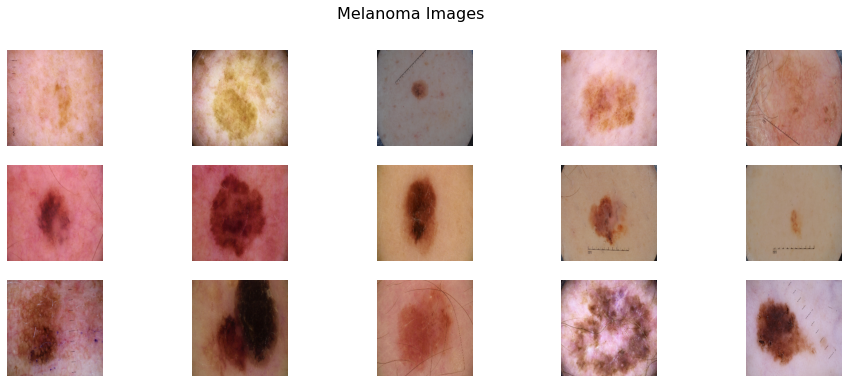

In [72]:
paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(16,6))
plt.suptitle('Melanoma Images', fontsize=16)
for i in range(0, 15):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    x = i // 5
    y = i % 5
    axes[x, y].imshow(image, cmap=plt.cm.bone)
    axes[x, y].axis('off')
    

# Non-Melanoma Images

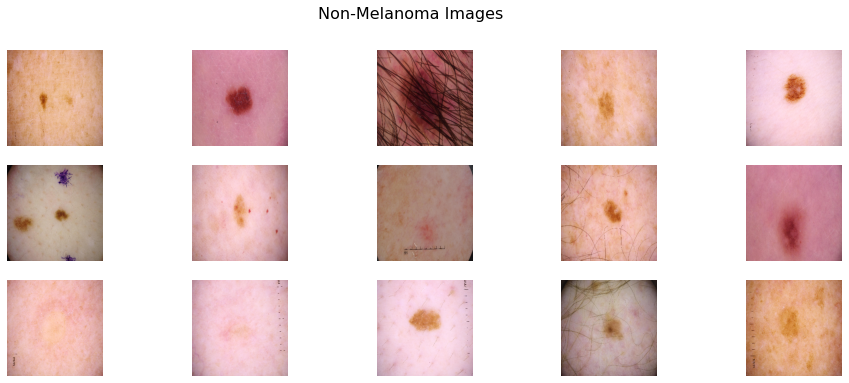

In [73]:
paths = glob('../split/train/not_mel/*.jpg')
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(16,6))
plt.suptitle('Non-Melanoma Images', fontsize=16)
for i in range(0, 15):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    x = i // 5
    y = i % 5
    axes[x, y].imshow(image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

# Creating Arrays out of Images

In [16]:
for infile in glob("../split/train/mel/2020/*.jpg")[:12]:
    lst = []
    file, ext = os.path.splitext(infile)
    im = Image.open(infile)
    np_im = np.array(im)
    lst.append(np_im)

# OpenCV Transformas

## Grayscale

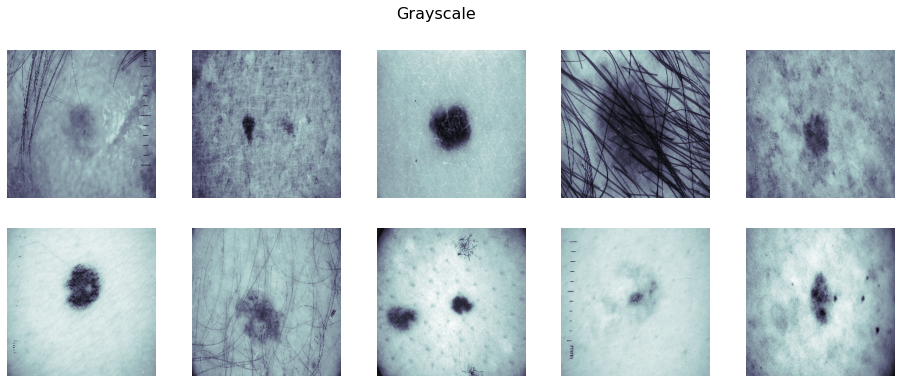

In [74]:
path = "../split/train_dcm"

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16, 6))
plt.suptitle('Grayscale', fontsize=16)
for i in range(0, 10):
    data = pydicom.read_file(os.path.join(path, df.dcm[i]))
    image = data.pixel_array

    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image = cv2.resize(image, (256,256))

    x = i // 5
    y = i % 5
    axes[x, y].imshow(image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Gaussian Blur

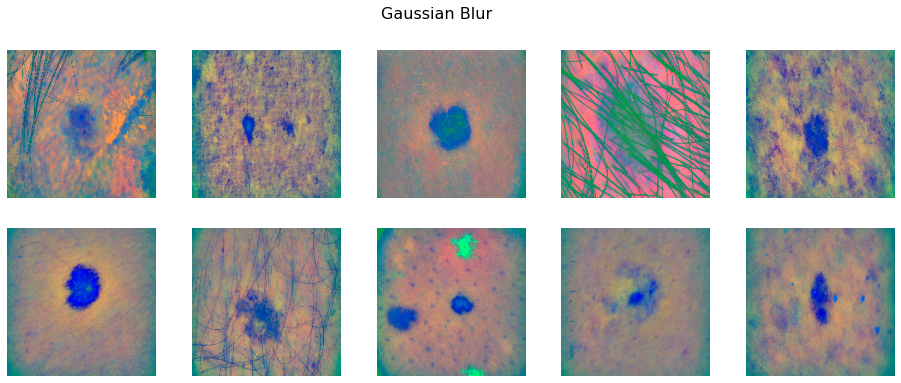

In [26]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('Gaussian Blur', fontsize=16)
for i in range(0, 10):
    data = pydicom.read_file(os.path.join(path, df.dcm[i]))
    image = data.pixel_array
    image = cv2.resize(image, (200,200))
    image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), 256/10), -4, 128)

    x = i // 5
    y = i % 5
    axes[x, y].imshow(image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Hue Saturation Brightness

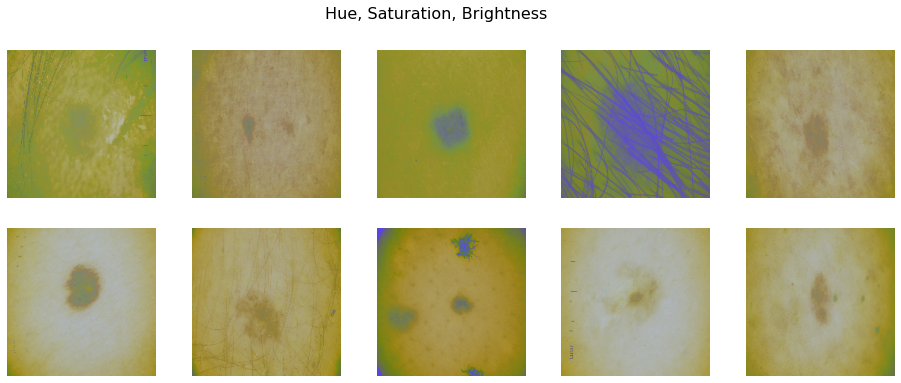

In [33]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('Hue, Saturation, Brightness', fontsize=16)
for i in range(0, 10):
    data = pydicom.read_file(df['path_dcm'][i])
    image = data.pixel_array
    
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    image = cv2.resize(image, (200,200))
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## LUV Colorspace

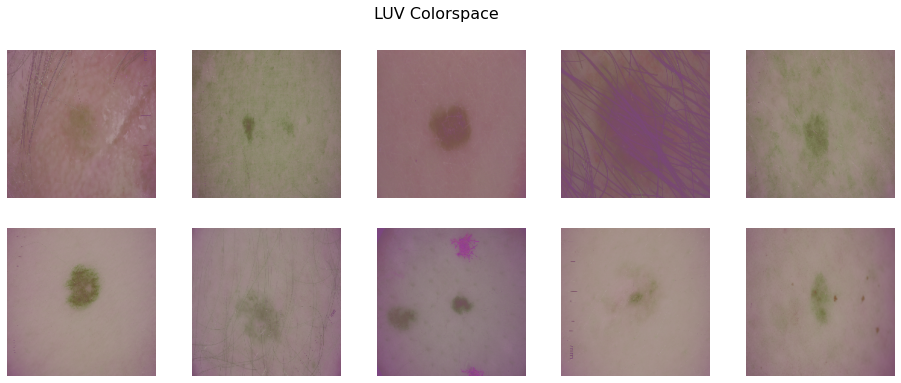

In [35]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('LUV Colorspace', fontsize=16)
for i in range(0, 10):
    data = pydicom.read_file(df['path_dcm'][i])
    image = data.pixel_array
    
    image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
    image = cv2.resize(image, (200,200))
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

# Albumentations Transformations

## Tranpose

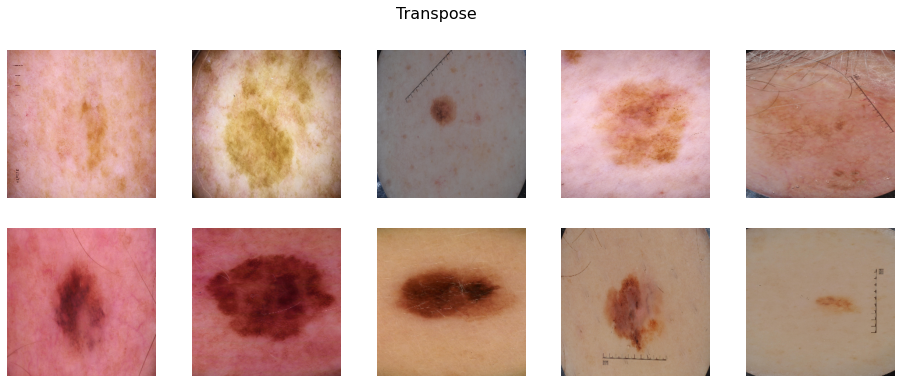

In [75]:
transform = A.Compose([
    A.Transpose()
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16, 6))
plt.suptitle('Transpose', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256, 256))
    transformed = transform(image=image)
    aug_image = transformed['image']
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Vertical Flip

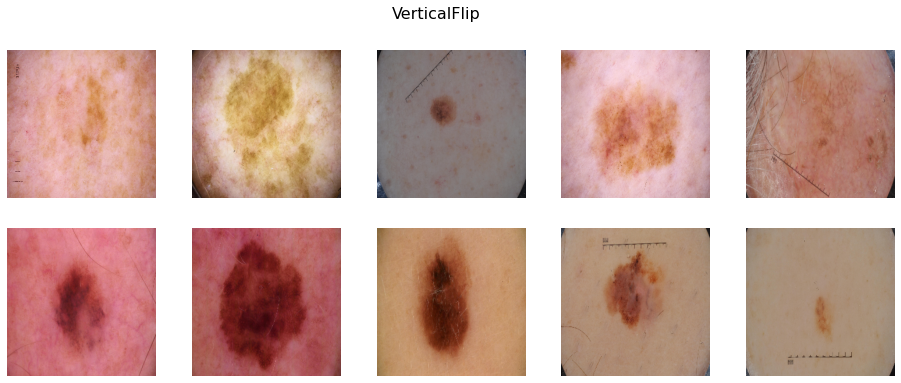

In [76]:
transform = A.Compose([
    A.VerticalFlip()
])
paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16, 6))
plt.suptitle('VerticalFlip', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256, 256))
    transformed = transform(image=image)
    aug_image = transformed['image']
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Horizontal FLip

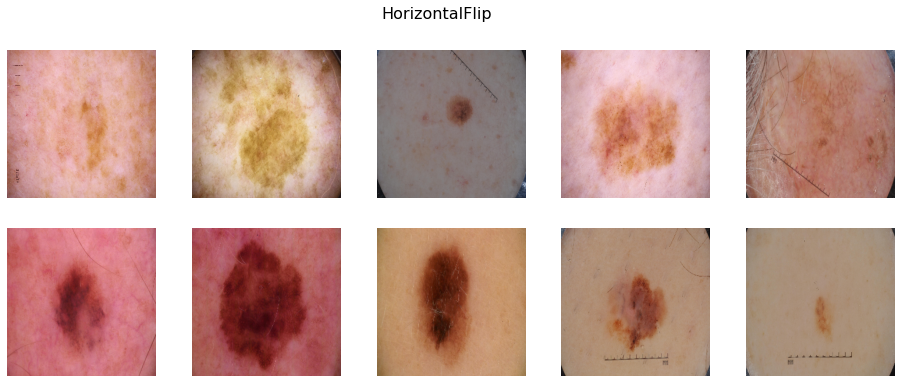

In [77]:
transform = A.Compose([
    A.HorizontalFlip()
])
paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('HorizontalFlip', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Random Brightness

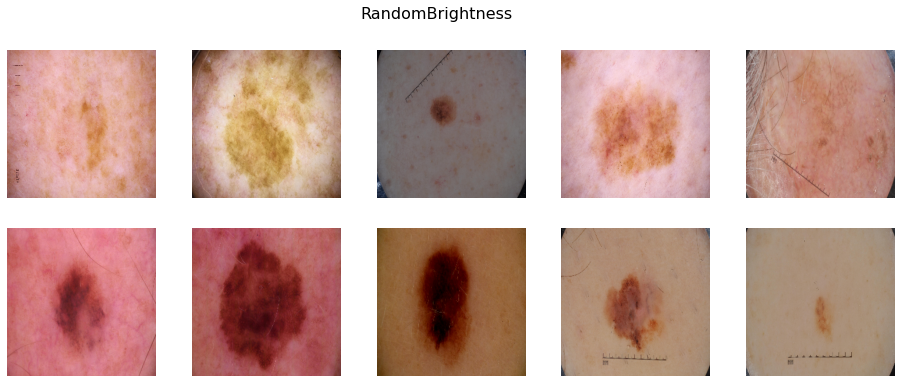

In [82]:
transform = A.Compose([
    A.RandomBrightness(limit=0.3)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('RandomBrightness', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Random Contrast

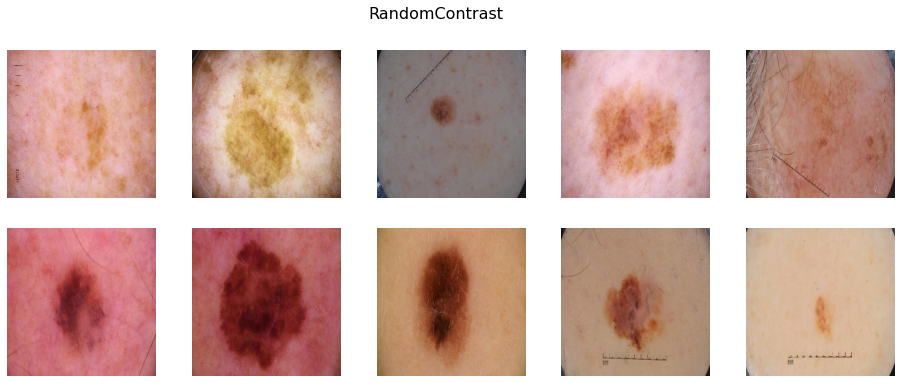

In [83]:
transform = A.Compose([
    A.RandomContrast(limit=0.3)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('RandomContrast', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## CLAHE

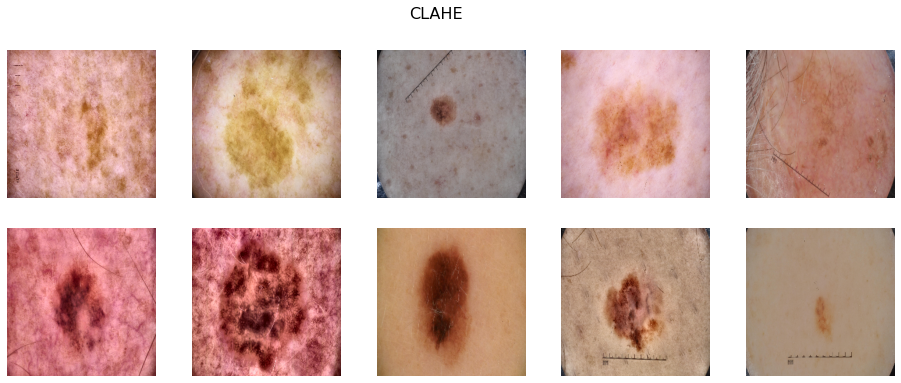

In [85]:
transform = A.Compose([
    A.CLAHE(clip_limit=6.0)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('CLAHE', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Shift Scale Rotate

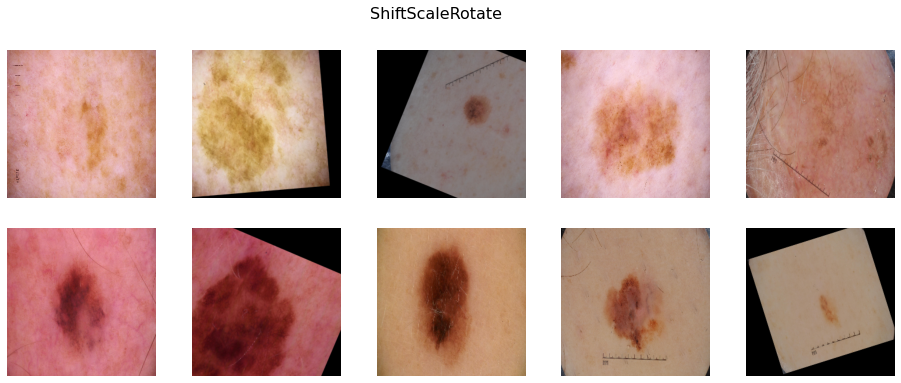

In [87]:
transform = A.Compose([
    A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, border_mode=0)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('ShiftScaleRotate', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Cutout

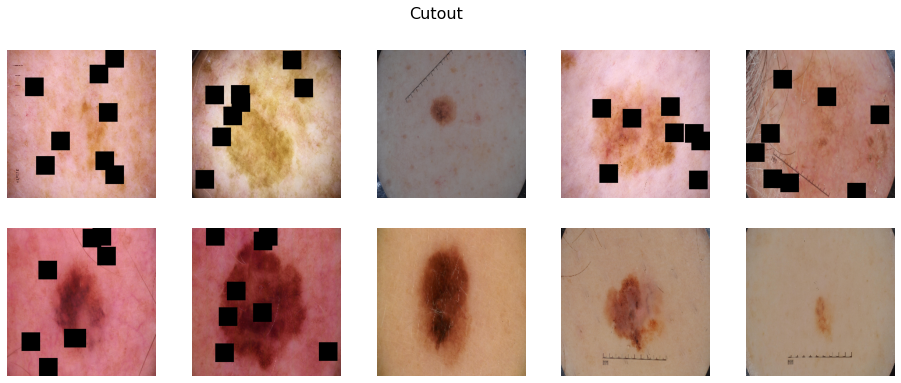

In [92]:
image_size = 128

transform = A.Compose([
    A.Cutout(max_h_size=32, max_w_size=32, num_holes=8)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('Cutout', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Motion Blur

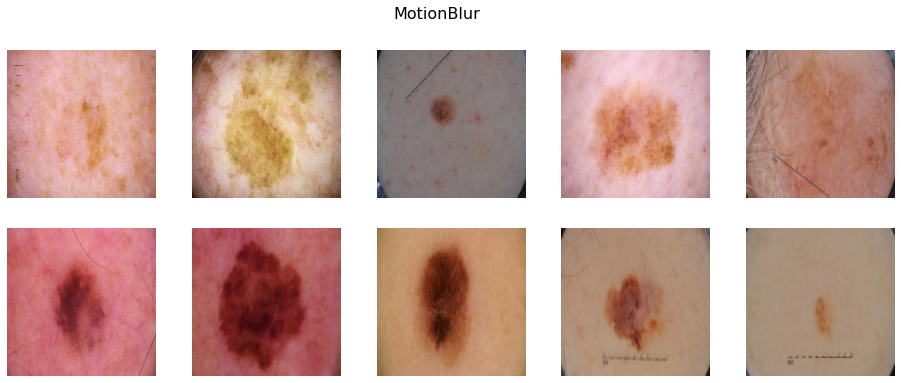

In [104]:
transform = A.Compose([
    A.MotionBlur(blur_limit=5)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('MotionBlur', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Median Blur

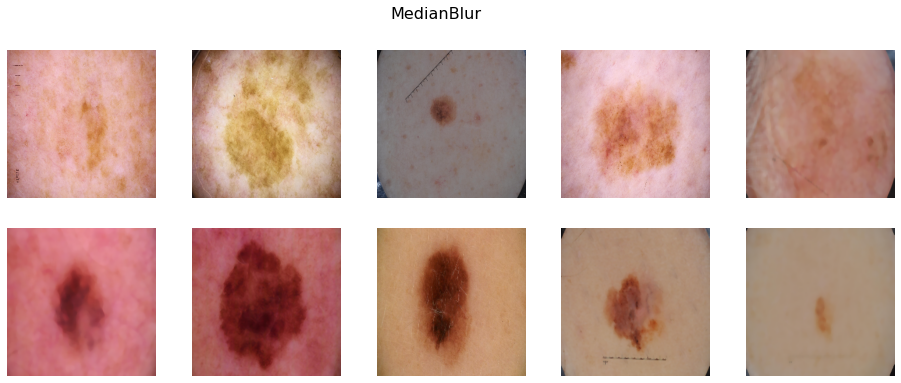

In [97]:
transform = A.Compose([
    A.MedianBlur(blur_limit=7)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('MedianBlur', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Gaussian Blur

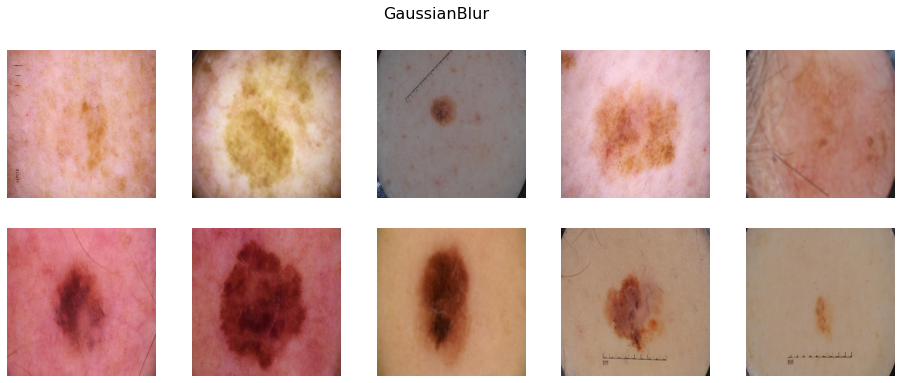

In [98]:
transform = A.Compose([
    A.GaussianBlur(blur_limit=7)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('GaussianBlur', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Gauss Noise

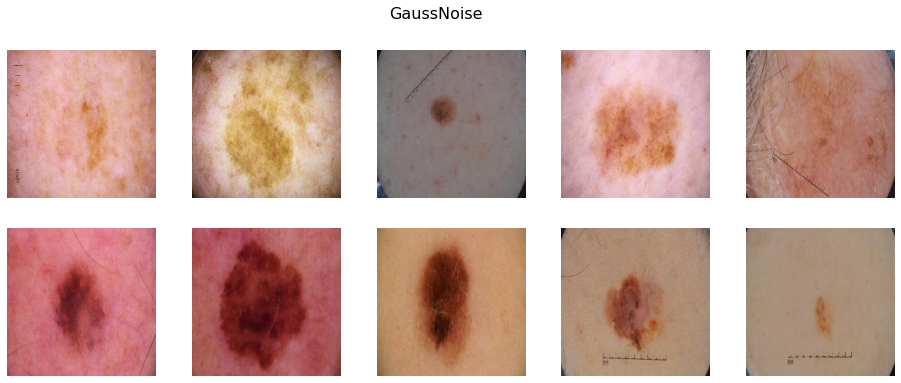

In [99]:
transform = A.Compose([
    A.GaussNoise(var_limit=(5.0, 30.0))
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('GaussNoise', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Optical Distortion

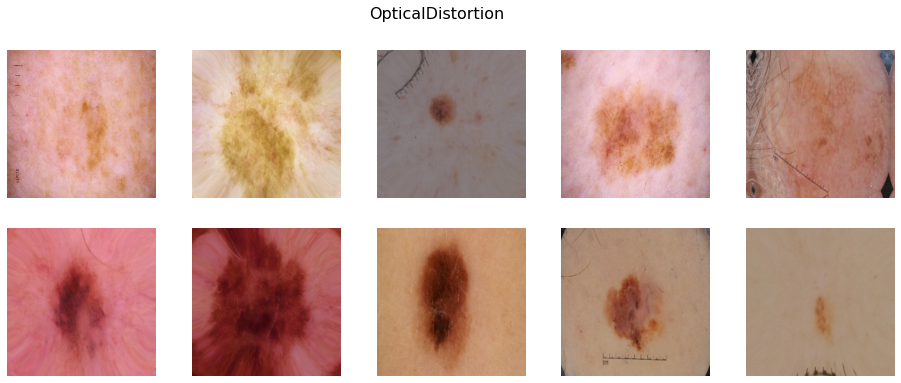

In [100]:
transform = A.Compose([
    A.OpticalDistortion(distort_limit=1.0)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('OpticalDistortion', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Grid Distortion

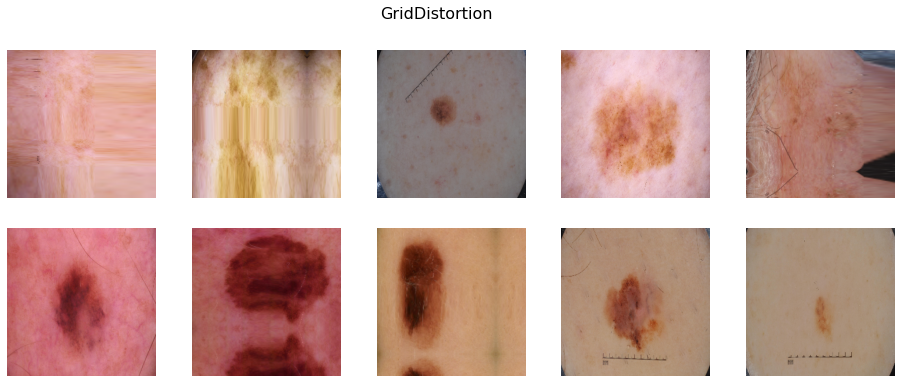

In [101]:
transform = A.Compose([
    A.GridDistortion(num_steps=5, distort_limit=1.)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('GridDistortion', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

## Elastic Transform

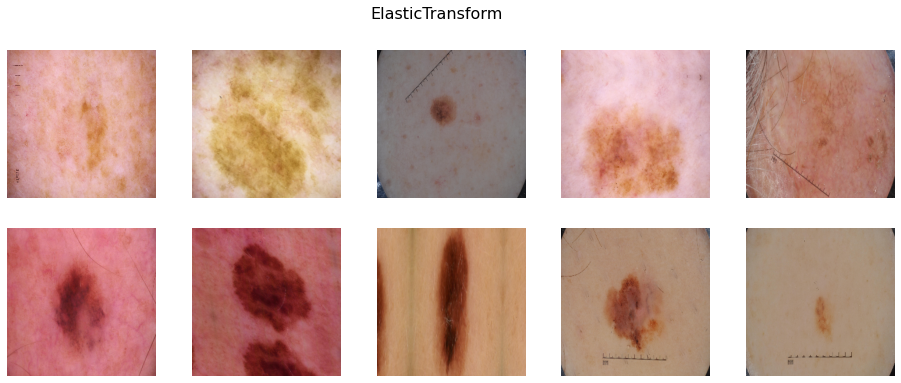

In [102]:
transform = A.Compose([
    A.ElasticTransform(alpha=3)
])

paths = glob('../split/train/mel/2020/*.jpg')
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16,6))
plt.suptitle('ElasticTransform', fontsize=16)
for i in range(0, 10):   
    image = cv2.imread(paths[i], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256,256))
    transformed = transform(image=image)
    aug_image = transformed['image']
   
    x = i // 5
    y = i % 5
    axes[x, y].imshow(aug_image, cmap=plt.cm.bone)
    axes[x, y].axis('off')

In [48]:
transform = A.Compose([
    A.Transpose(p=0.5),
    A.VerticalFlip(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightness(limit=0.2, p=0.75),
    A.RandomContrast(limit=0.2, p=0.75),
    A.OneOf([
        A.MotionBlur(blur_limit=5),
        A.MedianBlur(blur_limit=5),
        A.GaussianBlur(blue_limit=5),
        A.GaussNoise(var_limit(5.0, 30.0)),
    ], p=0.7),
    A.OneOf([
        A.OpticalDistortion(distort_limit=1.0),
        A.GridDistortion(num_steps=5, distort_limit=1.),
        A.ElasticTransform(alpha=3),
    ], p=0.7),
    A.CLAHE(clip_limit=4.0, p=0.7),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, border_mode=0, p=0.85),
    A.Resize(image_size, image_size),
    A.Cutout(max_h_size=int(image_size*0.375), max_w_size=int(image_size*0.375), num_holes=1, p=0.7),
    A.Normalize()
])


# PyTorch Transforms

In [ ]:
def hair_remove(image):
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    kernel = cv2.getStructuringElement(1,(17,17))
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)
    return final_image

In [ ]:
hairy_ = df[df["sex"] == 1].reset_index().iloc[[12, 14, 17, 22, 33, 34]]
image_list = hairy['path_jpg']
image_list = image_list.reset_index()['path_jpg']